In [12]:
%run ../Emulator.ipynb
%run ../Clusterer.ipynb

## Example 1: Select parameters without centered target

### Initialize emulator

The first cell is needed to define which inputs to exclude.

In [13]:
a = Emulator(
    region=[-30, 10, -45, 40],
    start_time="2017-07-01T00:00:00",
    end_time="2017-07-01T02:59:59"
)

myFeaturesNames = [
    "bparam",
    "acure_autoconv_exp_nd",
    "a_ent_1_rp",
    "acure_dry_dep_acc",
    "acure_dry_dep_ait",
    "acure_dry_dep_so2",
    "acure_bvoc_soa",
    "acure_dms",
    "acure_bl_nuc",
    "acure_ait_width",
    "acure_cloud_ph",
    "dbsdtbs_turb_0",
    "acure_bc_ri",
    "acure_sea_spray",
    "acure_carb_bb_diam",
    "acure_anth_so2_r",
    "acure_prim_so4_diam"
]

In [15]:
a1 = Emulator(
    region=[-30, 10, -45, 40],
    excludeFeats=list(set(a.__get_input_names__()) - set(myFeaturesNames)),
    nu=0.5,
    start_time="2017-07-01T00:00:00",
    end_time="2017-07-01T02:59:59",
    centerTarget=False
)

#### Train

In [144]:
job1 = a1.train()

In [145]:
job1.status()#.errors[0].errorLog

c3.BatchJobStatus(
 started=datetime.datetime(2022, 10, 4, 7, 0, 46, tzinfo=datetime.timezone.utc),
 startedby='jcarzon@andrew.cmu.edu',
 status='running')

#### Fetch parameters

In [17]:
job3 = a1.__retrieve_emulator_pixelwise__()

In [24]:
job3.status()

c3.MapReduceStatus(
 started=datetime.datetime(2022, 10, 24, 16, 5, 43, tzinfo=datetime.timezone.utc),
 startedby='jcarzon@andrew.cmu.edu',
 status='running',
 step='readInput')

### Initialize clusterer

In [28]:
b1 = Clusterer(a1, job3)

In [29]:
b1.lengthscales

,acure_bl_nuc,acure_ait_width,acure_cloud_ph,acure_carb_bb_diam,acure_prim_so4_diam,acure_sea_spray,acure_anth_so2_r,acure_bvoc_soa,acure_dms,acure_dry_dep_ait,...,acure_dry_dep_so2,acure_bc_ri,bparam,acure_autoconv_exp_nd,dbsdtbs_turb_0,a_ent_1_rp,modelId,latitude,longitude,time
0,17.886242,74547.917449,100000.000000,100000.000000,11.610030,11.688245,55.839820,22.501675,25.458628,23.250327,...,48.266407,22.353768,67781.951278,78507.409200,81.527822,42.634501,22fbd100-0758-4881-9d2b-05adb330962c,-0.625,-0.9375,2017-07-01 00:20:00
1,13.334092,59.769665,61.282151,66886.145935,6.765336,5.770524,33.441265,14.119822,13.734016,11.704311,...,17.703100,11.206558,17609.486237,11884.768878,39.455151,31.178838,b91bddd0-841f-4518-b535-bede1a18bbca,-0.625,-10.3125,2017-07-01 00:20:00
2,19.926617,100000.000000,102.493815,25541.155266,7.181398,8.001949,33.133651,17.521603,15.130124,18.161535,...,22.097574,13.658567,23489.015481,25922.971077,57.721461,35.039188,5b0c376a-dc6e-41b7-9382-2f7f1f72fffb,-0.625,-12.1875,2017-07-01 00:20:00
3,22.986883,7499.029667,72.080052,6711.285876,7.569049,7.210324,28.166687,16.780626,15.001391,22.579818,...,13.515525,15.332913,8771.096264,1032.358034,50.764865,37.738016,63b6a1e2-9415-4ed7-b58b-50c8e110530a,-0.625,-14.0625,2017-07-01 00:20:00
4,22.115471,14737.043656,146.976104,100000.000000,10.184216,8.226890,42.021915,20.090523,34.184177,24.209723,...,20.553613,15.188396,100000.000000,100.122927,66.197566,48.900016,0a03d8c3-c5fc-4a89-a0d2-e0ba4e6806f3,-0.625,-15.9375,2017-07-01 00:20:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1435,18.546700,84042.820909,17394.397197,100000.000000,7.282580,11.826580,78.987899,6.648302,19.549341,29.358643,...,37012.096493,54.136695,5789.711376,47.555992,79558.774295,16579.510432,d3b05a45-1c67-4135-9438-c33d7f88d173,-6.875,36.5625,2017-07-01 00:20:00
1436,24.854235,1838.155511,690.378237,9077.499017,7.663590,11.262432,75.856109,10.906859,34.538010,27.972943,...,8107.064944,47.112680,9623.468149,54.460724,75.829705,68.656471,738979b1-4296-4790-9a1e-c75184d8e7bf,-6.875,38.4375,2017-07-01 00:20:00
1437,29.449122,28763.335399,93.810022,14128.453148,16.132247,9.662841,164.380566,30.986630,53.790169,43.152997,...,90.535198,87.555642,56549.637129,7918.007231,100000.000000,31.441497,74bfd301-c25a-465b-acd5-208c7c8efe7c,-6.875,4.6875,2017-07-01 00:20:00
1438,59.018015,91.479989,90222.343209,34444.566212,16.337580,9.684074,103.650775,51.630191,49.473270,54.549513,...,128.829532,86.636759,73559.491708,219.370646,100000.000000,70.181603,d4fe27ca-4888-4098-a530-51b3813edb5a,-6.875,6.5625,2017-07-01 00:20:00


#### Write length scales to csv file

In [167]:
with open("07_01_midnight_lengthscales", "w") as f:
    f.write(b1.lengthscales.to_csv())

In [171]:
with open("07_01_midnight_lengthscales", "r") as f:
    print(pd.read_csv(f))

      Unnamed: 0  acure_bl_nuc  acure_ait_width  acure_cloud_ph  \
0              0     17.886242     74547.917449   100000.000000   
1              1     13.334092        59.769665       61.282151   
2              2     19.926617    100000.000000      102.493815   
3              3     22.986883      7499.029667       72.080052   
4              4     22.115471     14737.043656      146.976104   
...          ...           ...              ...             ...   
1435        1435     18.546700     84042.820909    17394.397197   
1436        1436     24.854235      1838.155511      690.378237   
1437        1437     29.449122     28763.335399       93.810022   
1438        1438     59.018015        91.479989    90222.343209   
1439        1439    148.833768       200.175354    30678.568743   

      acure_carb_bb_diam  acure_prim_so4_diam  acure_sea_spray  \
0          100000.000000            11.610030        11.688245   
1           66886.145935             6.765336         5.770524 

### Perform the clustering

In [30]:
b1.cluster_pixels(clusteringMethod="kmeans", k=3, handleSmallClusters=True)
b1.labels

array([1, 2, 1, ..., 1, 1, 1])

In [31]:
np.unique(b1.labels, return_counts=True)

(array([0, 1, 2]), array([111, 881, 448]))

#### Inspect clusters spatially

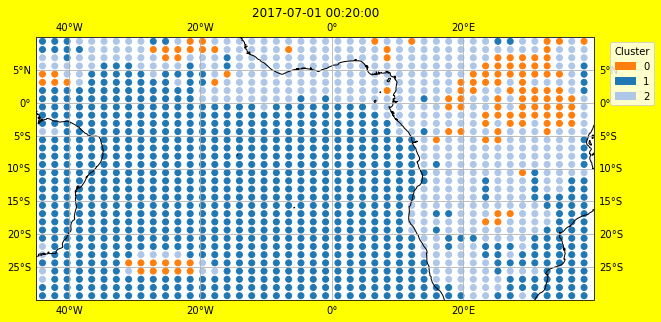

In [32]:
b1.plot_clusters(folder_title='uncentered_target_3_clusters', save=False)

#### Evaluate the clusters' importance rankings

In [33]:
b1.parameter_importance()

Center of cluster 0
                     name      value
0     acure_prim_so4_diam   2.033188
1       acure_dry_dep_acc   2.774517
2          acure_bvoc_soa   3.815082
3               acure_dms   6.545544
4            acure_bl_nuc   7.055219
5         acure_sea_spray   7.852525
6       acure_dry_dep_ait   8.301154
7   acure_autoconv_exp_nd   9.091710
8              a_ent_1_rp   9.787750
9             acure_bc_ri  11.275836
10      acure_dry_dep_so2  13.407322
11         dbsdtbs_turb_0  16.546908
12                 bparam  20.214496
13       acure_anth_so2_r  25.155073
14        acure_ait_width  30.344236
15     acure_carb_bb_diam  33.383114
16         acure_cloud_ph  50.569592


Center of cluster 1
                     name       value
0         acure_sea_spray    9.792637
1     acure_prim_so4_diam   14.818840
2       acure_dry_dep_acc   22.299767
3          acure_bvoc_soa   44.015409
4               acure_dms   45.301302
5       acure_dry_dep_so2   48.197036
6              a_ent_1_rp 

[                     name      value
 0     acure_prim_so4_diam   2.033188
 1       acure_dry_dep_acc   2.774517
 2          acure_bvoc_soa   3.815082
 3               acure_dms   6.545544
 4            acure_bl_nuc   7.055219
 5         acure_sea_spray   7.852525
 6       acure_dry_dep_ait   8.301154
 7   acure_autoconv_exp_nd   9.091710
 8              a_ent_1_rp   9.787750
 9             acure_bc_ri  11.275836
 10      acure_dry_dep_so2  13.407322
 11         dbsdtbs_turb_0  16.546908
 12                 bparam  20.214496
 13       acure_anth_so2_r  25.155073
 14        acure_ait_width  30.344236
 15     acure_carb_bb_diam  33.383114
 16         acure_cloud_ph  50.569592,
                      name       value
 0         acure_sea_spray    9.792637
 1     acure_prim_so4_diam   14.818840
 2       acure_dry_dep_acc   22.299767
 3          acure_bvoc_soa   44.015409
 4               acure_dms   45.301302
 5       acure_dry_dep_so2   48.197036
 6              a_ent_1_rp   64.353010
 7 

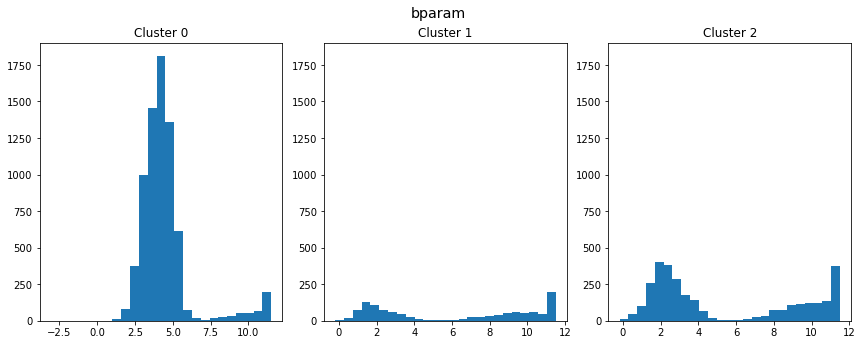

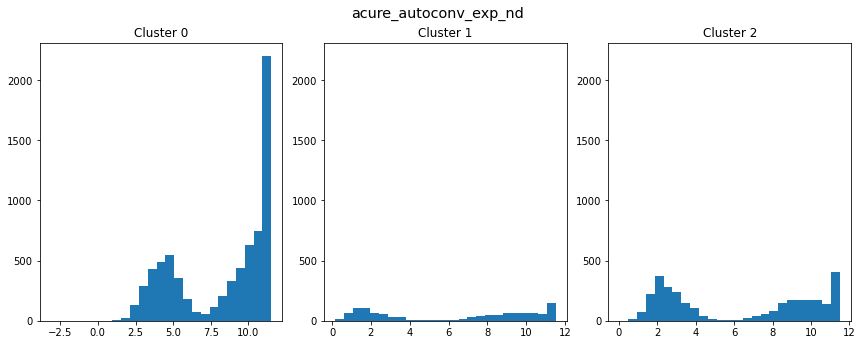

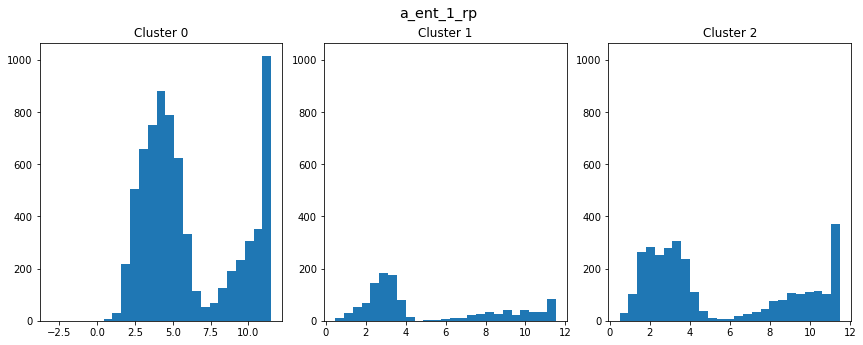

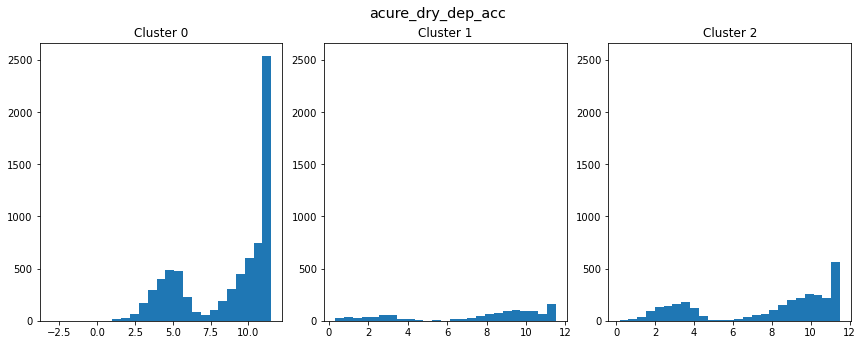

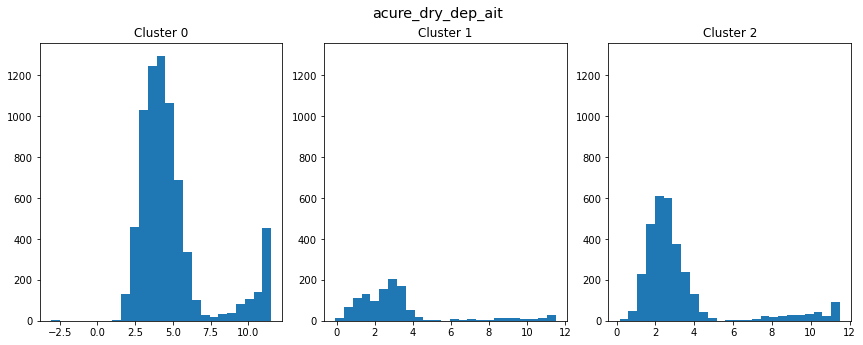

...

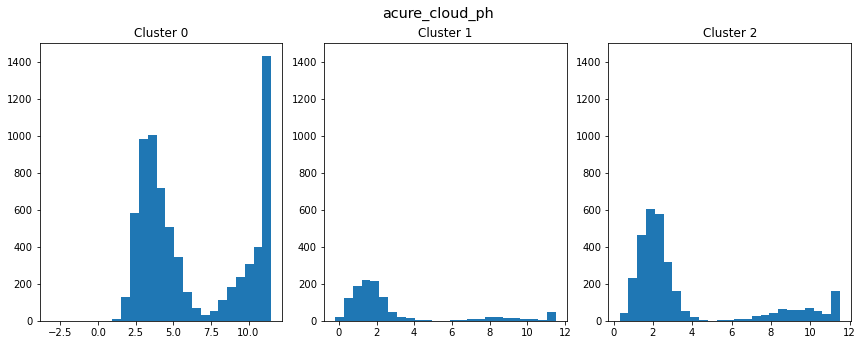

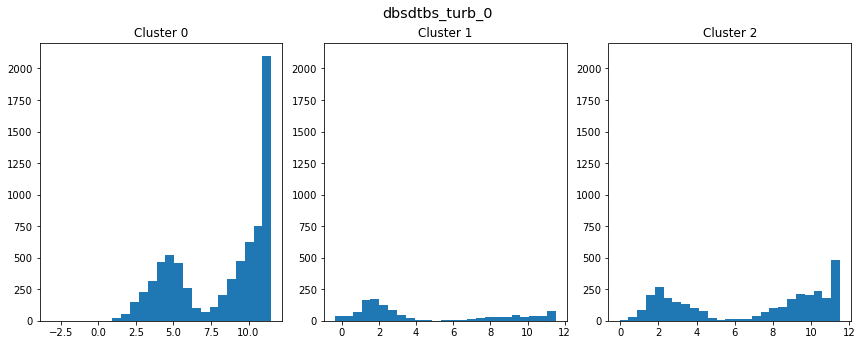

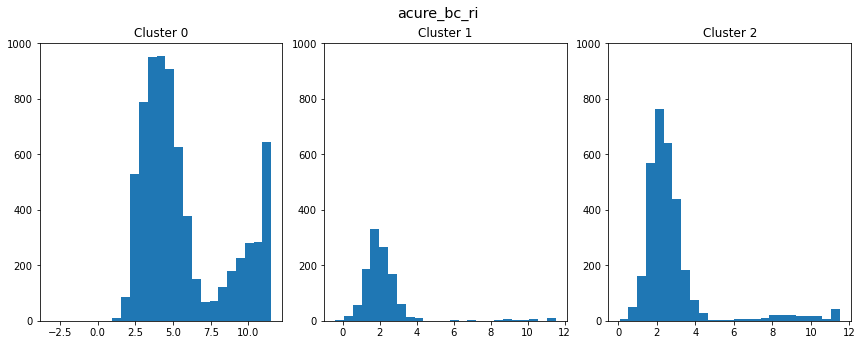

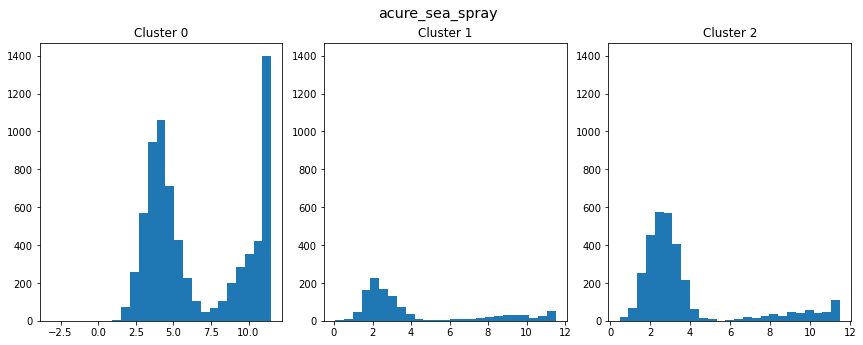

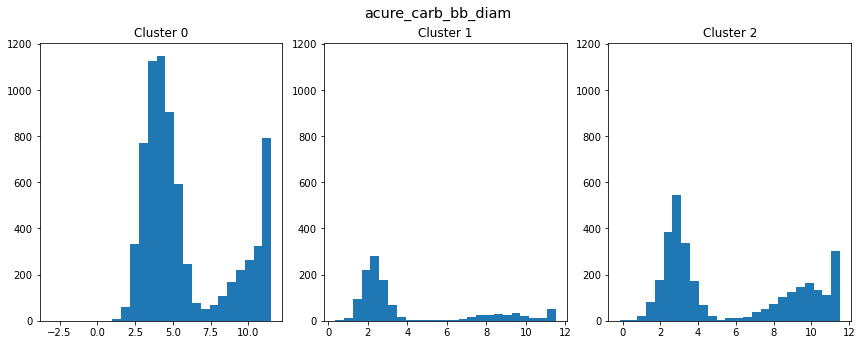

In [309]:
b1.clustering_accuracy(myFeaturesNames)

In [35]:
import matplotlib.pyplot as plt

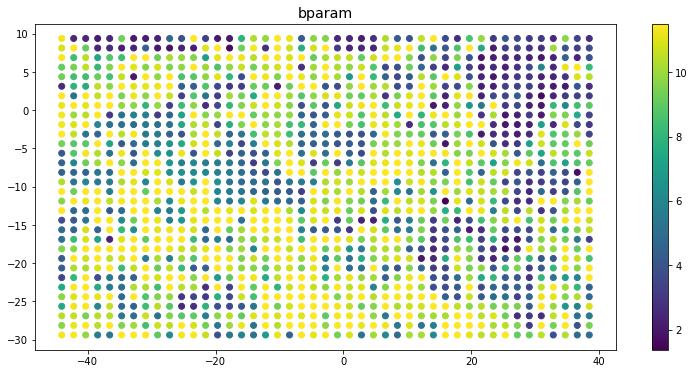

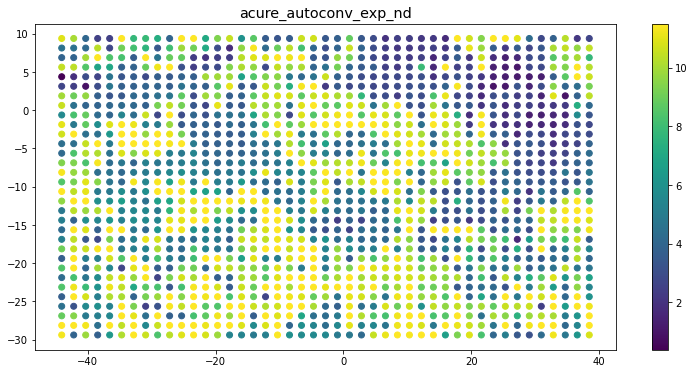

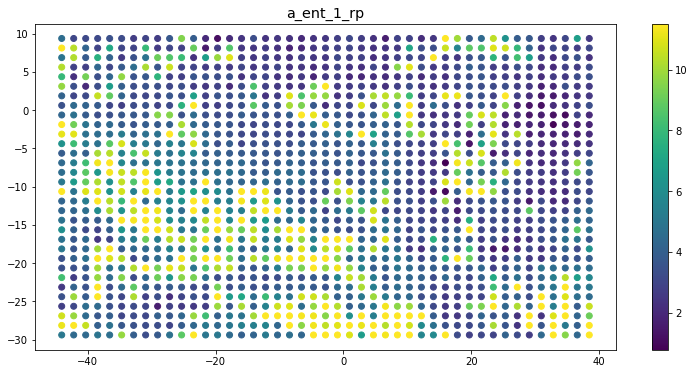

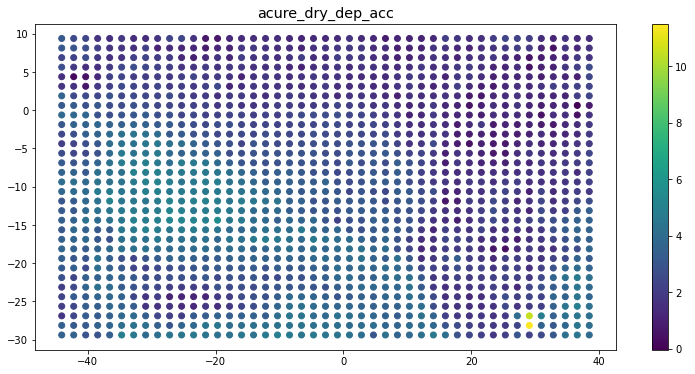

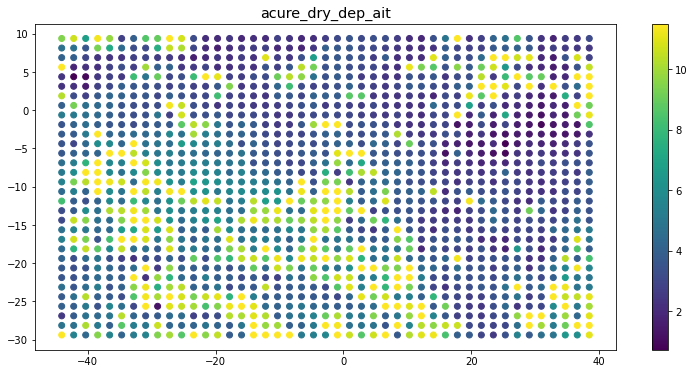

...

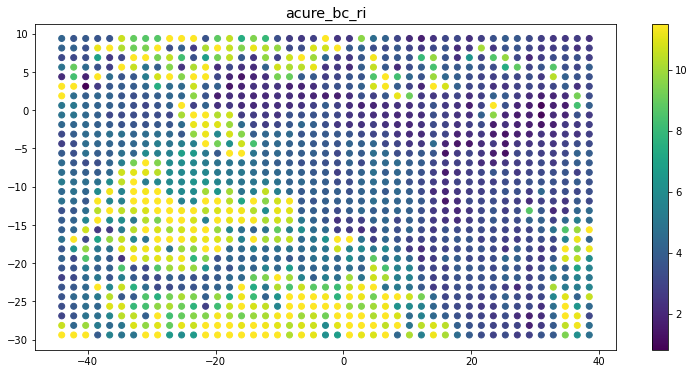

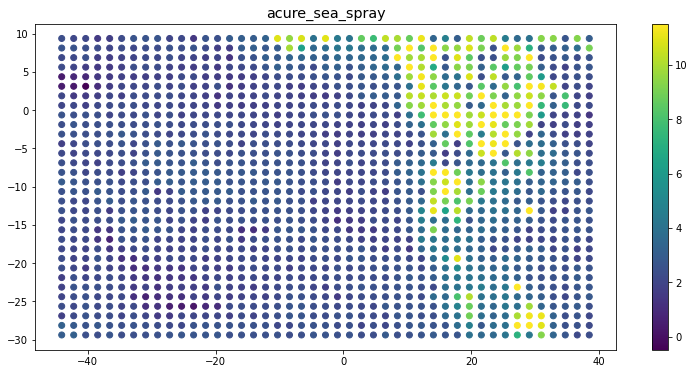

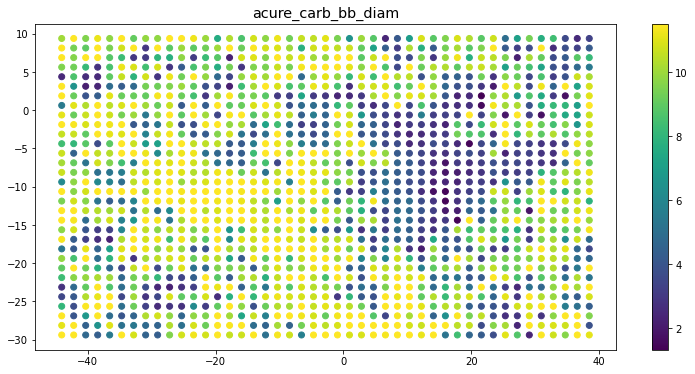

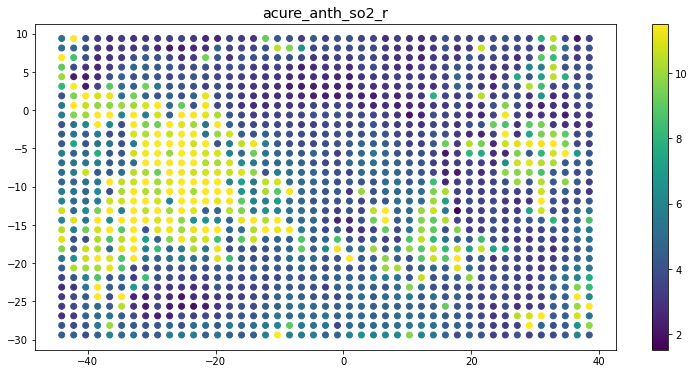

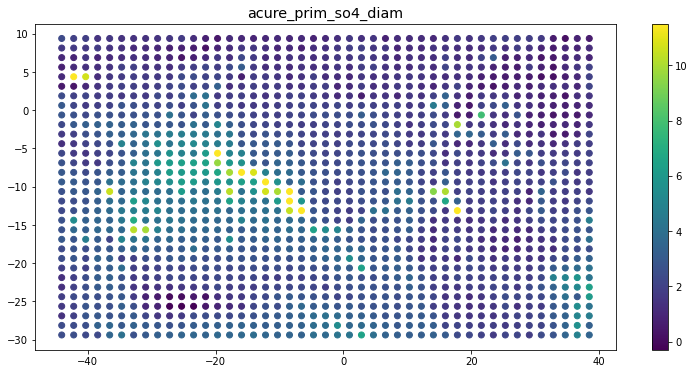

In [34]:
b1.plot_length_scales(myFeaturesNames)

#### t-SNEs

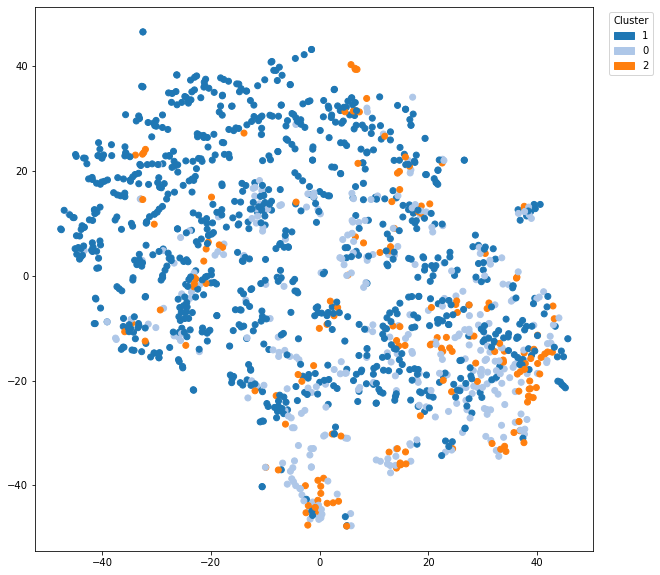

In [47]:
b1.t_sne_plot(learningRate=100, perplexity=30)

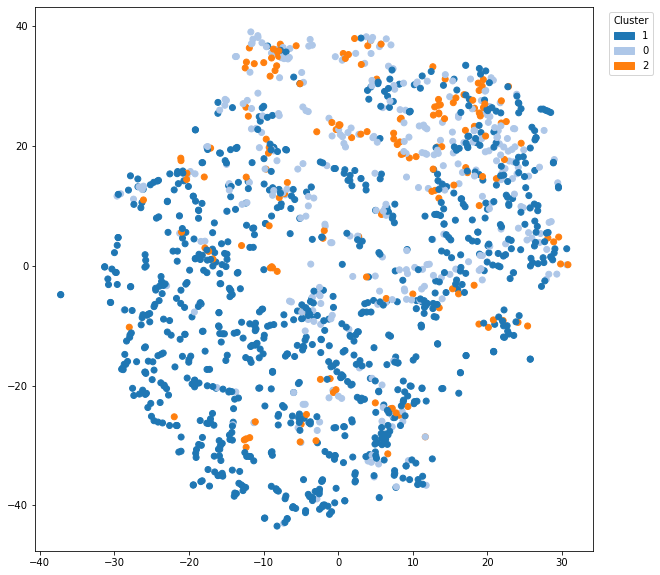

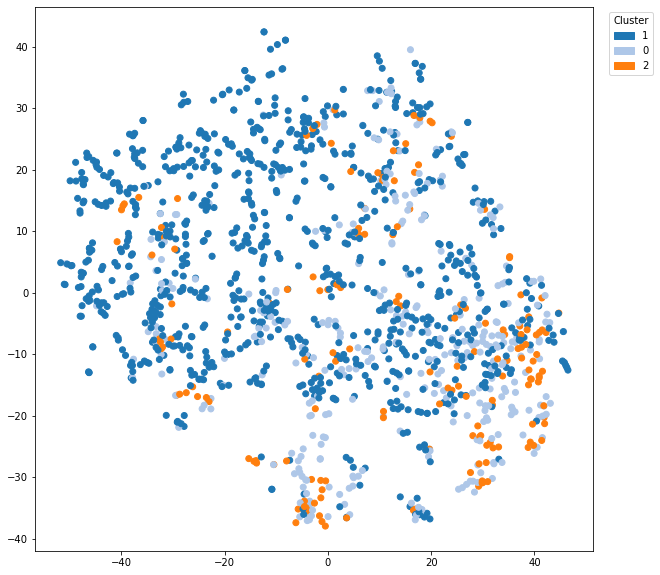

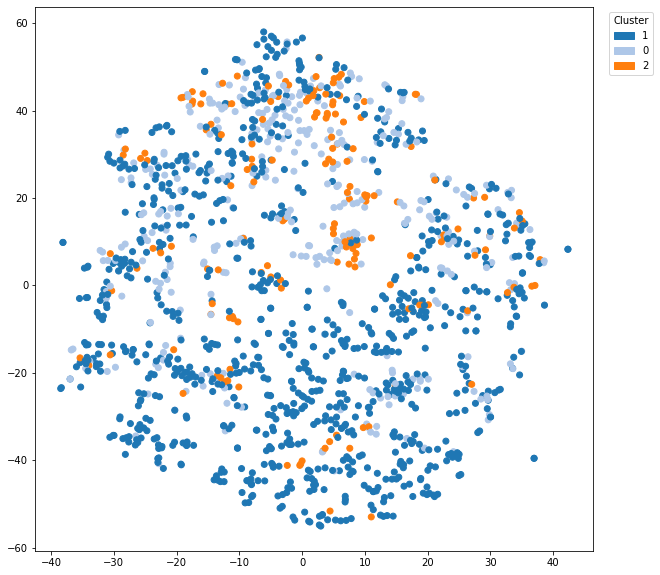

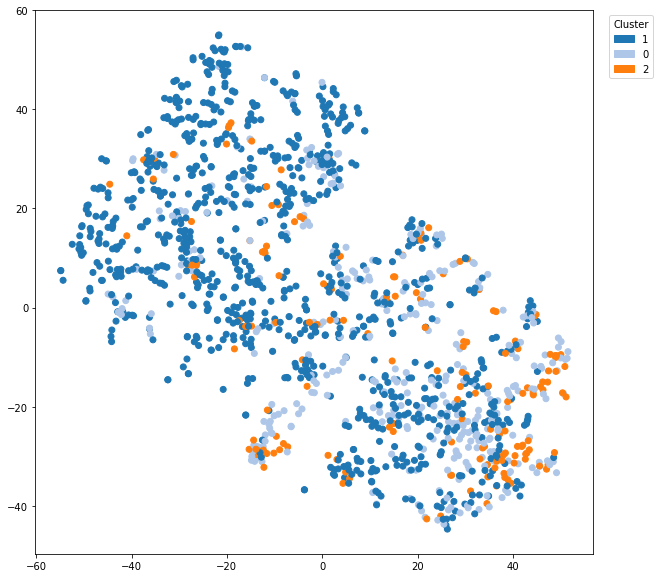

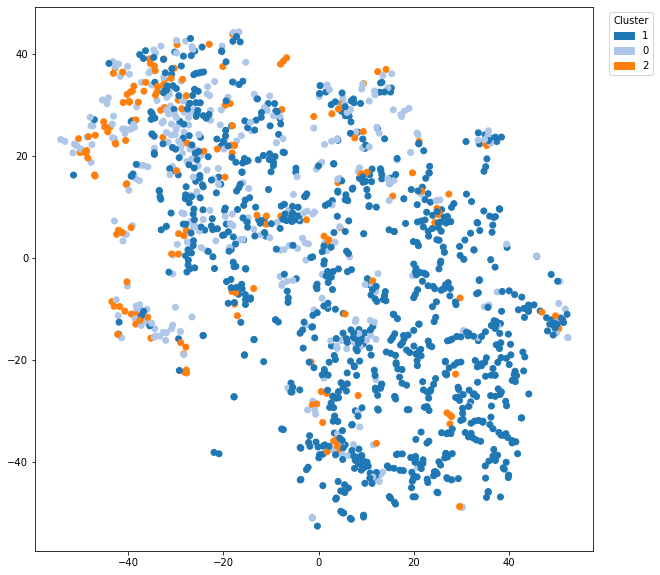

In [48]:
for rate in [10, 50, 150, 500, 1000]:
    b1.t_sne_plot(learningRate=rate)

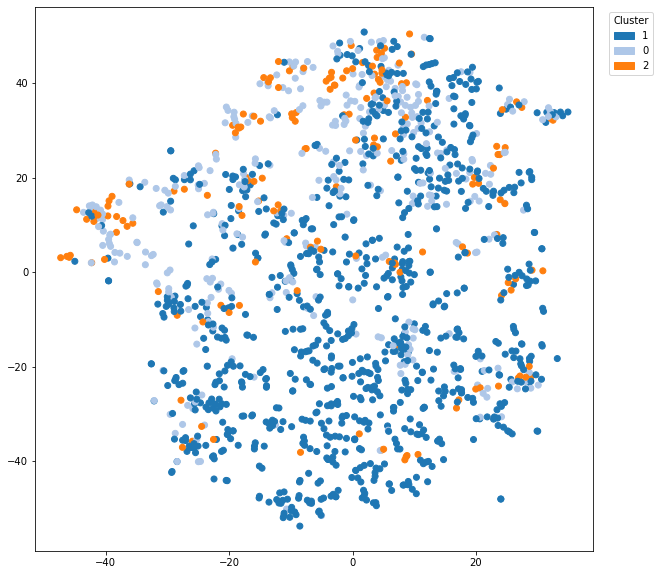

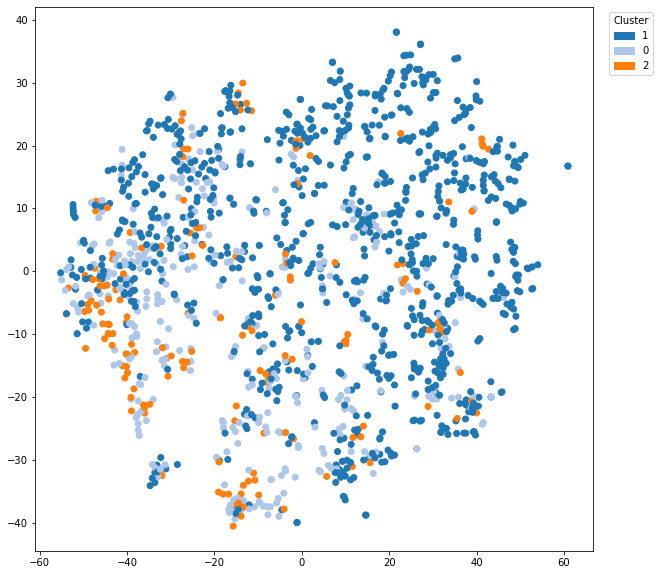

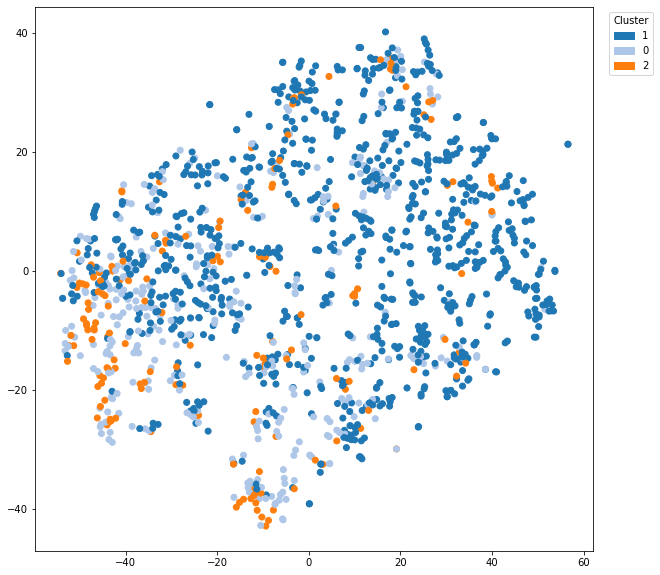

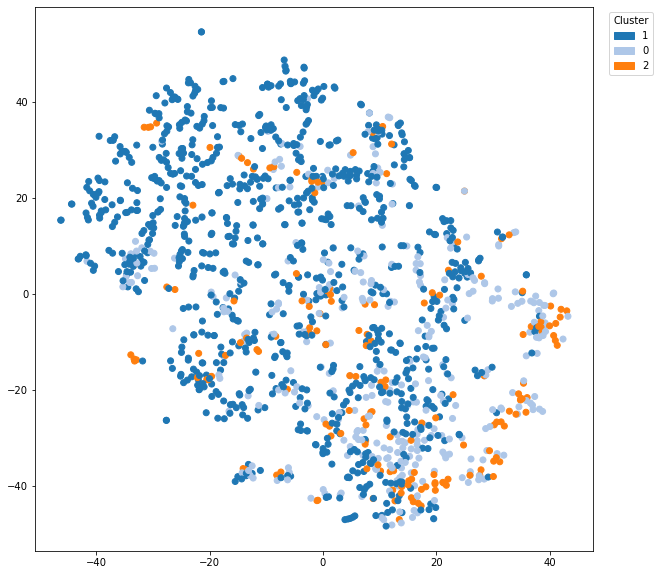

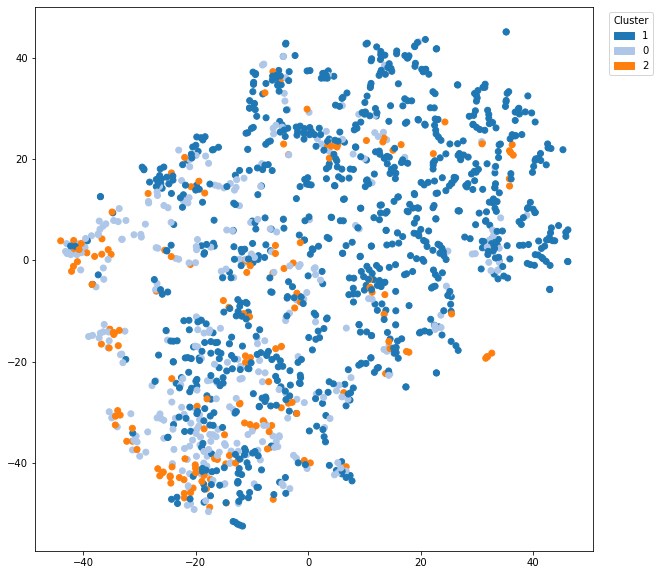

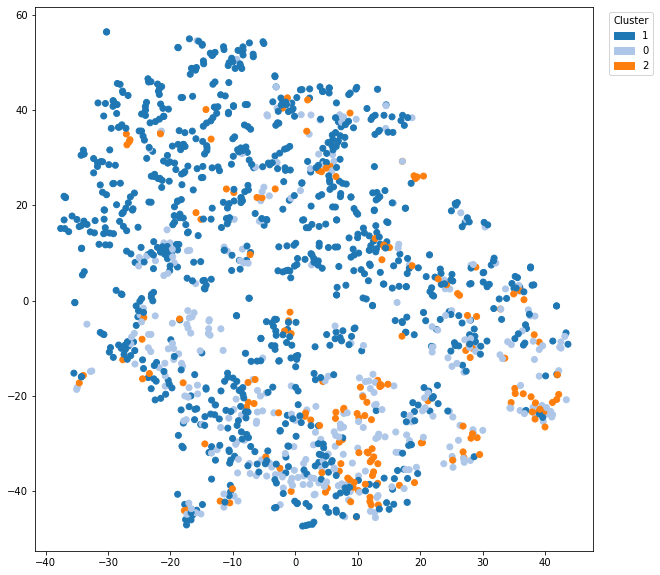

In [49]:
for perplex in [3, 8, 15, 30, 50, 100]:
    b1.t_sne_plot(perplexity=perplex)

## Example 2: Select parameters with centered target

### Initialize emulator

In [8]:
a2 = Emulator(
    region=[-30, 10, -45, 40],
    excludeFeats=list(set(a.get_input_names()) - set(myFeaturesNames)),
    start_time="2017-07-01T00:00:00",
    end_time="2017-07-01T02:59:59",
    centerTarget=True
)

NameError: name 'a' is not defined

#### Train

In [36]:
job2 = a2.train()

In [42]:
job2.status()#.errors[0].errorLog

c3.BatchJobStatus(
 started=datetime.datetime(2022, 10, 4, 16, 38, 19, tzinfo=datetime.timezone.utc),
 startedby='jcarzon@andrew.cmu.edu',
 completed=datetime.datetime(2022, 10, 4, 16, 57, 43, tzinfo=datetime.timezone.utc),
 status='completed',
 newBatchSubmitted=False)

#### Fetch parameters

In [62]:
job4 = a2.retrieve_emulator_pixelwise()

In [65]:
job4.status()

c3.MapReduceStatus(
 started=datetime.datetime(2022, 10, 5, 17, 0, 45, tzinfo=datetime.timezone.utc),
 startedby='jcarzon@andrew.cmu.edu',
 status='running',
 step='readInput')

### Initialize clusterer

In [49]:
b2 = Clusterer(a2, job4)

In [50]:
b2.lengthscales

,acure_bl_nuc,acure_ait_width,acure_cloud_ph,acure_carb_bb_diam,acure_prim_so4_diam,acure_sea_spray,acure_anth_so2_r,acure_bvoc_soa,acure_dms,acure_dry_dep_ait,...,acure_dry_dep_so2,acure_bc_ri,bparam,acure_autoconv_exp_nd,dbsdtbs_turb_0,a_ent_1_rp,modelId,latitude,longitude,time
0,9.234966,90150.421480,100000.000000,70727.856777,5.971368,6.058915,28.106973,11.358908,13.110471,12.040487,...,24.493311,11.600692,62536.398087,77321.308354,41.337929,21.463313,4754e131-3c20-4021-8fbc-c11dc2416aed,-0.625,-0.9375,2017-07-01 00:20:00
1,8.211904,35.678256,37.606812,59181.795893,4.169383,3.601145,20.367561,8.607423,8.370230,7.242221,...,10.750657,6.997130,48318.609922,21929.794673,23.903261,18.966433,86e4270f-807f-4be7-bb37-5e17a714909c,-0.625,-10.3125,2017-07-01 00:20:00
2,13.361981,1558.406016,4546.974095,8671.808673,4.730450,5.287885,21.502342,11.532419,9.704177,12.043871,...,14.259820,9.094130,11284.128104,20203.913929,36.863387,22.932885,649f4ad9-1b89-4989-8926-050c8c5212da,-0.625,-12.1875,2017-07-01 00:20:00
3,14.466849,100000.000000,43.440314,100000.000000,4.543254,4.342699,16.724894,10.026155,8.897938,14.040187,...,7.884940,9.486309,100000.000000,23334.067158,29.699939,22.069741,00133c9f-2b06-4570-a2fe-f72701b4c50e,-0.625,-14.0625,2017-07-01 00:20:00
4,15.869357,1584.367824,104.214273,3834.995025,7.352080,5.946642,30.067845,14.461436,24.957911,17.549539,...,14.610897,10.992800,3772.697973,72.868843,47.798142,35.024705,bfe42ee1-6193-4f30-9802-f4001e40bdcb,-0.625,-15.9375,2017-07-01 00:20:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1435,9.648917,100000.000000,73272.321651,100000.000000,3.802165,6.125166,40.344466,3.439323,10.182047,15.126310,...,100000.000000,27.872891,7717.454794,24.271991,100000.000000,100000.000000,07e788f4-5076-400d-8ed7-cc70f80009c8,-6.875,36.5625,2017-07-01 00:20:00
1436,11.821729,292.841805,245.296159,4311.526915,3.646055,5.278871,35.021827,5.138042,16.320069,13.194009,...,2874.184259,22.213625,5070.360067,25.446433,34.934117,32.398628,90ffe018-e933-4c9a-b265-41123c76eec9,-6.875,38.4375,2017-07-01 00:20:00
1437,11.738667,9933.129421,38.559263,4691.169157,6.349510,3.764315,55.124644,12.056600,20.794762,17.238099,...,34.388569,33.848179,38376.568117,5182.289295,80315.728972,12.362241,c576dcd9-3261-4df8-bb68-09db255b8e5c,-6.875,4.6875,2017-07-01 00:20:00
1438,23.572153,36.773545,100000.000000,84072.835281,6.606353,3.910650,41.839624,20.277529,19.766258,22.143900,...,52.141439,34.299338,100000.000000,90.732263,100000.000000,28.617145,b5963571-ac11-46f7-a1fc-103b11dec5ab,-6.875,6.5625,2017-07-01 00:20:00


In [60]:
with open("lengthscale_tables/2017-07-01T00:00:00_2017-07-07T23:59:59", "w") as f:
    f.write(b2.lengthscales.to_csv())

### Perform the clustering

In [55]:
b2.cluster_pixels(clusteringMethod="kmeans", k=3, handleSmallClusters=True)
b2.labels

array([0, 0, 0, ..., 0, 0, 0])

In [56]:
np.unique(b2.labels, return_counts=True)

(array([0, 1, 2]), array([1165,   33,  242]))

#### Inspect clusters spatially

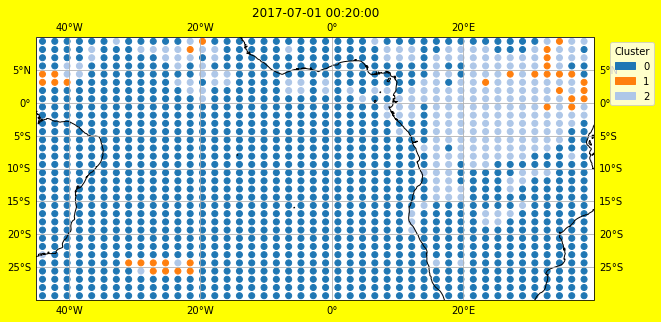

In [57]:
b2.plot_clusters(folder_title='centered_target_2_clusters_july_1_7', save=False)

#### Evaluate the clusters' importance rankings

In [58]:
clusters = b2.parameter_importance()

Center of cluster 0
                     name       value
0         acure_sea_spray    5.698881
1     acure_prim_so4_diam    5.863588
2       acure_dry_dep_acc    7.759442
3          acure_bvoc_soa   12.701703
4               acure_dms   20.457378
5       acure_dry_dep_so2   20.636379
6              a_ent_1_rp   24.829037
7       acure_dry_dep_ait   25.704676
8            acure_bl_nuc   27.163990
9             acure_bc_ri   27.481141
10       acure_anth_so2_r   36.617531
11         dbsdtbs_turb_0   45.534428
12  acure_autoconv_exp_nd   57.365232
13     acure_carb_bb_diam   79.280091
14        acure_ait_width   86.875689
15                 bparam   86.962820
16         acure_cloud_ph  100.941616


Center of cluster 1
                     name      value
0     acure_prim_so4_diam   0.608886
1       acure_dry_dep_acc   0.976764
2         acure_sea_spray   1.162953
3          acure_bvoc_soa   3.121414
4       acure_dry_dep_so2   3.332828
5              a_ent_1_rp   3.413369
6              

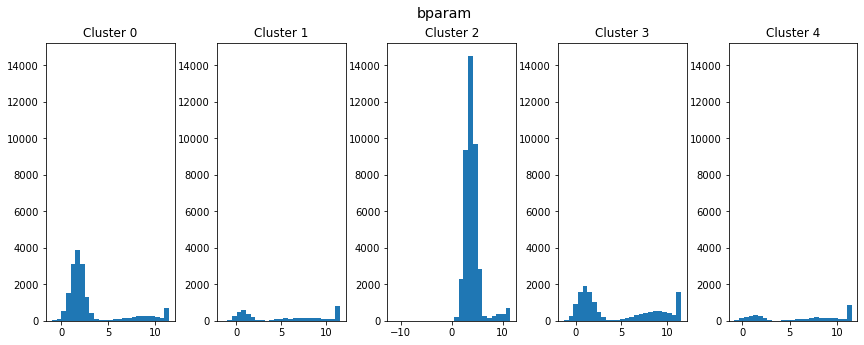

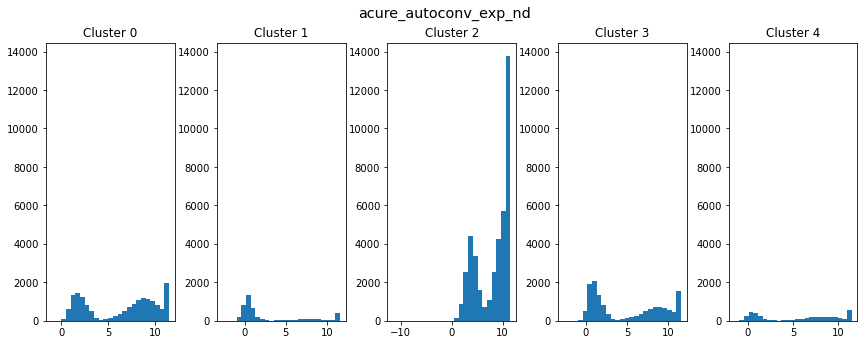

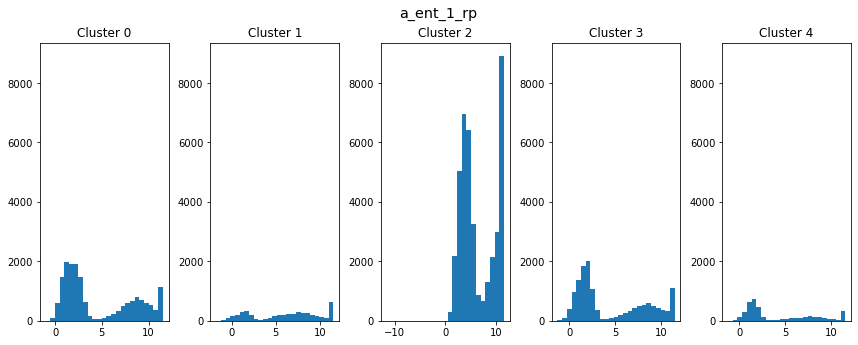

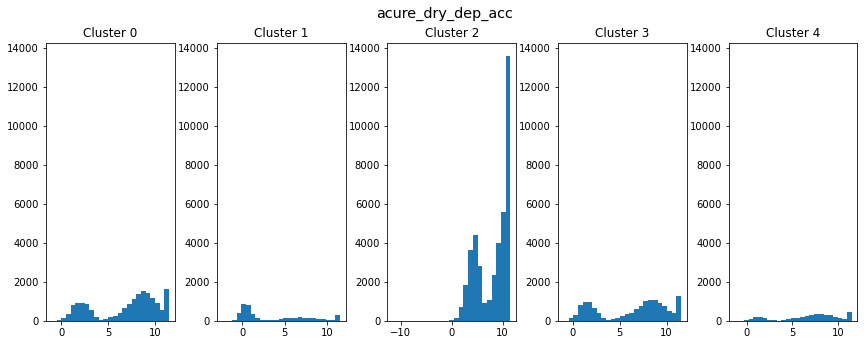

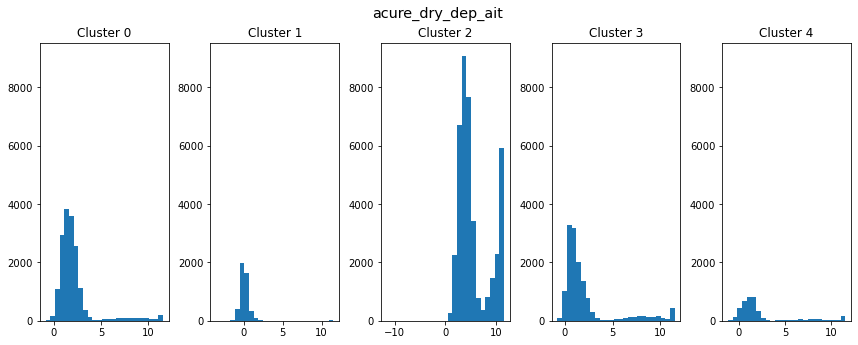

...

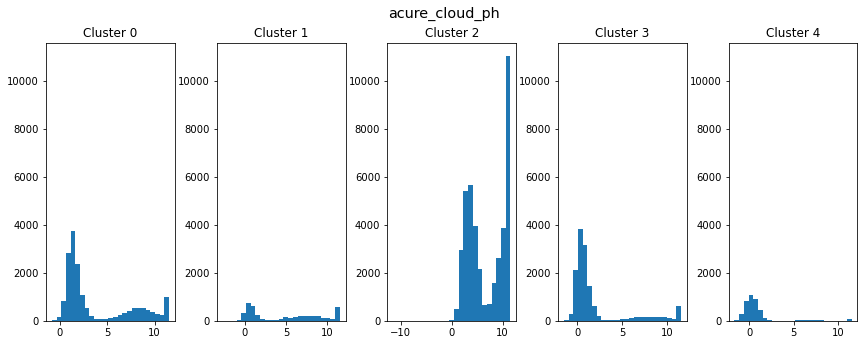

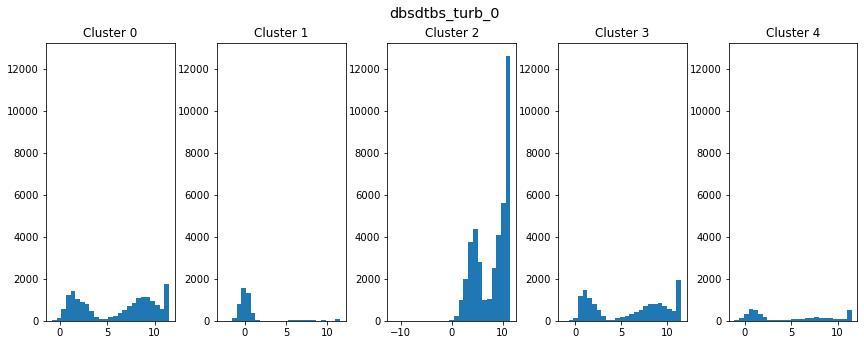

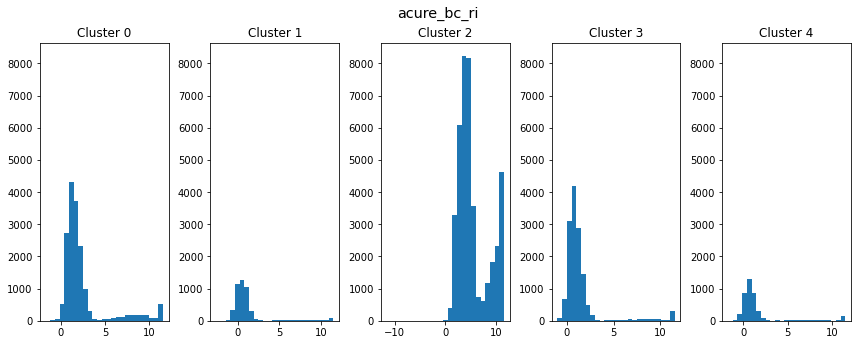

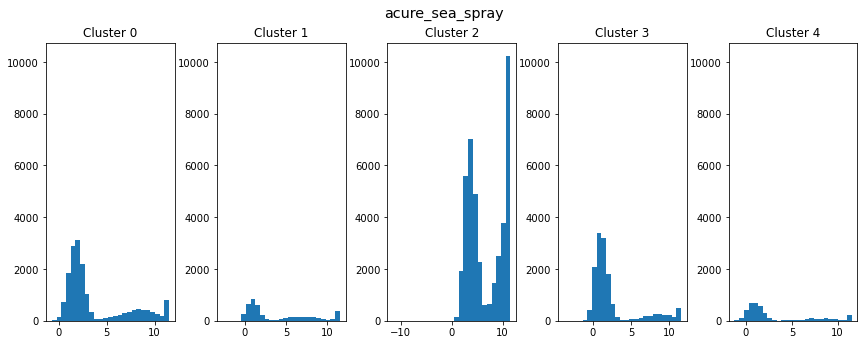

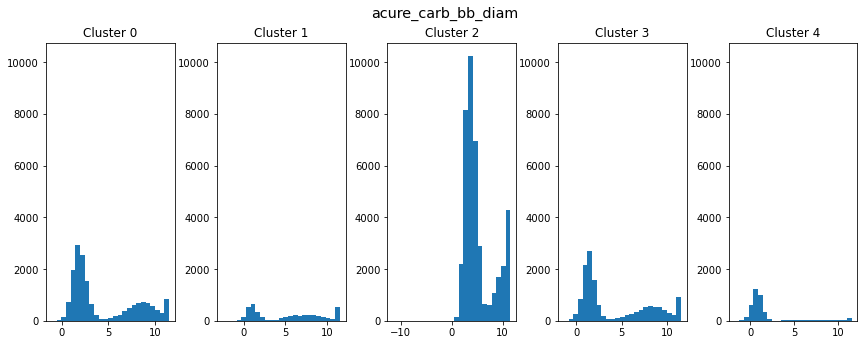

In [314]:
b2.clustering_accuracy(myFeaturesNames)

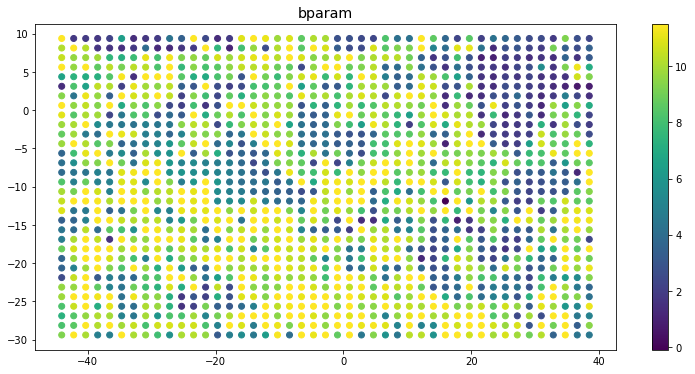

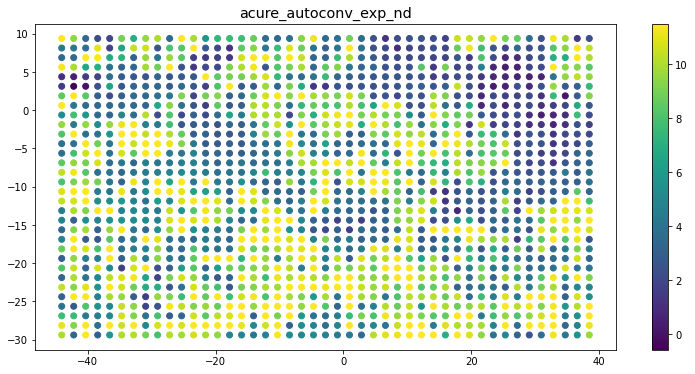

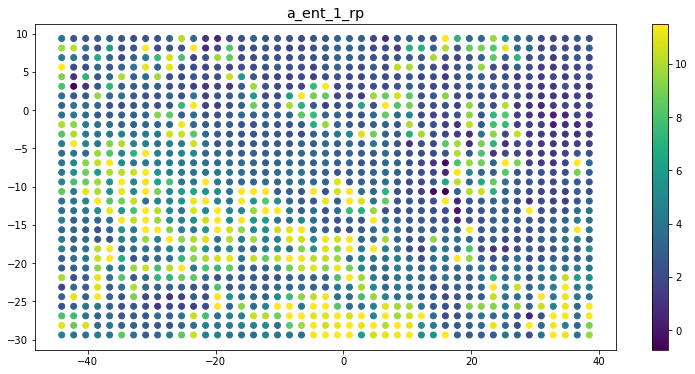

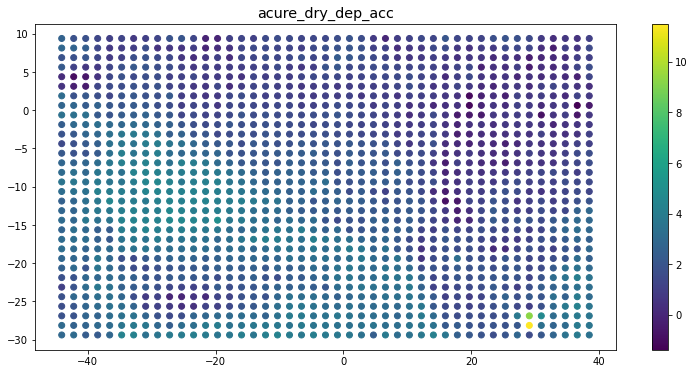

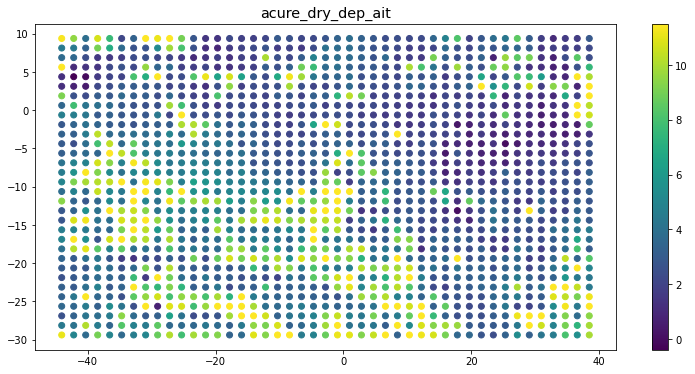

...

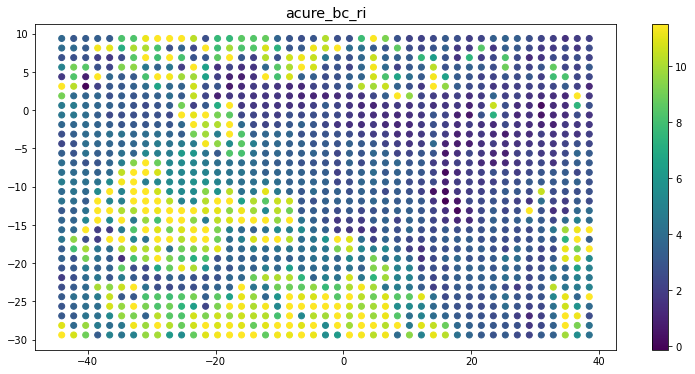

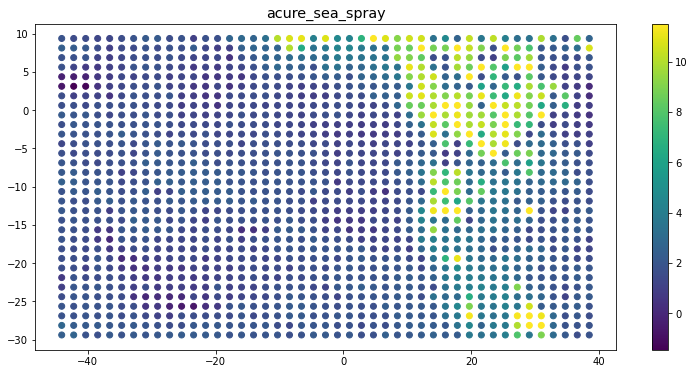

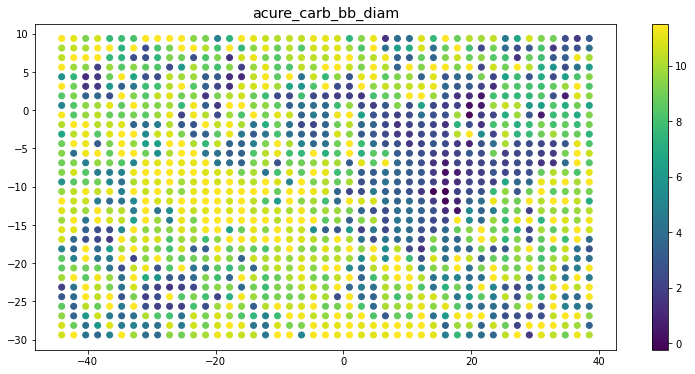

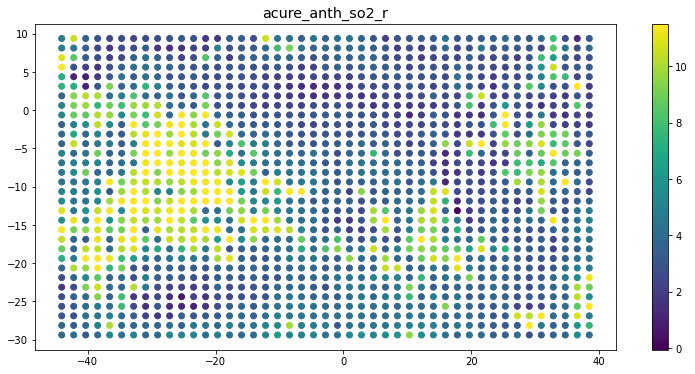

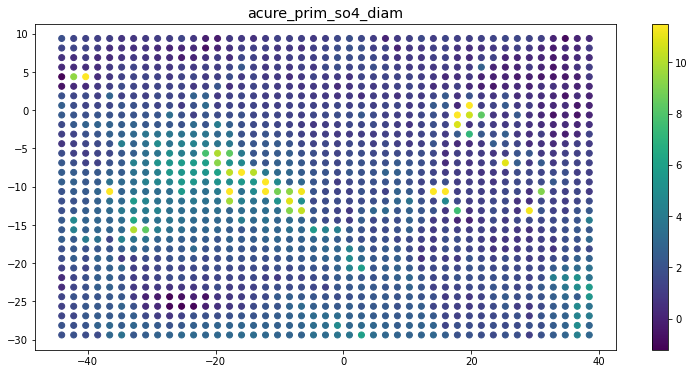

In [59]:
b2.plot_length_scales(myFeaturesNames)

#### t-SNEs

ValueError: 'c' argument must be a color, a sequence of colors, or a sequence of numbers, not 0       (0.12156862745098039, 0.4666666666666667, 0.70...
1                                                     NaN
2                                                     NaN
3                                                     NaN
4                                                     NaN
                              ...                        
1435                                                  NaN
1436                                                  NaN
1437                                                  NaN
1438                                                  NaN
1439                                                  NaN
Name: colors, Length: 1440, dtype: object

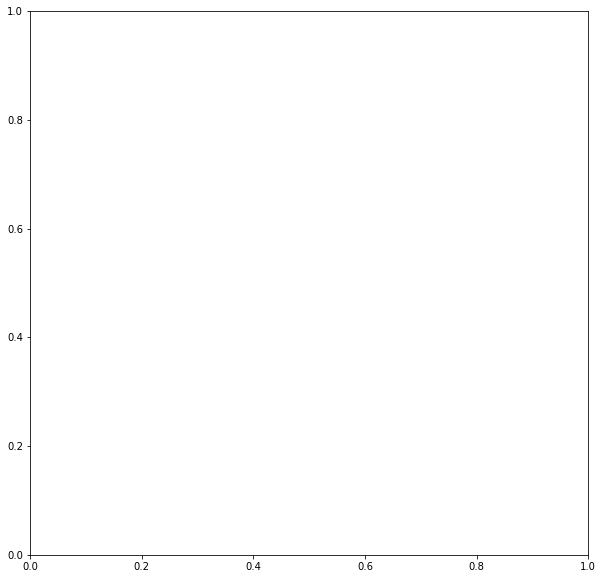

In [130]:
b2.t_sne_plot(learningRate=100, perplexity=30)